# Capstone Project - Final Assessment
*Applied Data Science Capstone - <a href='https://www.coursera.org/learn/applied-data-science-capstone/home/welcome'>Coursera</a>*

## Business problem
In this project we will try to find the the right location for a coffee shop in London (understanding location as Borough or cluster of Boroughs). The criteria to classify and rank the different Boroughs is agreed with the client.

Demographic preferences. 
1. Growing population
2. Working population
3. Mid-high income
4. Low crime rate

## Analytics approach
We are going to search for different sources of data that combined can help us make a better decision. The data we are going to analyze can be grouped into:
1. Pure demographics data. Looking at areas where the population is growing.
2. Profiling data including unemployment rates, average gross income and average house price and crime indicators.
3. Business metrics, number of businesses, two-year business survival rate.
4. Competition and other business in the area information. 


## Data Sources
London Boroughs Population - <a href='https://www.citypopulation.de/php/uk-greaterlondon.php'>UK National Statistics</a>   
London Borough Profiles - <a href="https://data.london.gov.uk/dataset/london-borough-profiles">London Data Store</a>  
London Boroughs GeoJson file - <a href="https://joshuaboyd1.carto.com/tables/london_boroughs_proper/public">Carto.com</a>  
FourSquare API - <a href='https://foursquare.com/developers/explore#req=users%2Fself'>Google Cloud</a>    
Postcode Lookup API - <a href="https://postcodes.io/">Postcodes.io</a>  

In [2]:
# Common standard libraries
import datetime
import time
import os

# libraries to handle data
import numpy as np
import pandas as pd
import geopandas as gpd
import requests
import json
from pandas.io.json import json_normalize
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# plotting modules
%matplotlib inline
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns
import folium
import branca.colormap as cm
from folium.plugins import MarkerCluster
from folium import IFrame
sns.set(style="whitegrid", palette="rainbow")
sns.set(rc={'figure.figsize':(11,7)})

# machine learning modules
from sklearn.cluster import KMeans

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

## 1. Getting / Cleaning the Data
### 1.1 List of boroughs and population trends from wikipedia
We start scraping wikipedia to get the full list and correct names of all the Boroughs. We also include the population in 2011 and 2017.

In [3]:
# we will use BeautifulSoup to scrape and parse the data
from bs4 import BeautifulSoup

In [4]:
url = 'https://www.citypopulation.de/php/uk-greaterlondon.php'
r = requests.get(url)
soup = BeautifulSoup(r.text, "html.parser")
table = soup.find_all('table', class_='data')

In [5]:
lst = pd.read_html(str(table))
df_web = pd.DataFrame(lst[0])
df_web = df_web.drop(['Status', 'PopulationEstimate1981-06-30','PopulationEstimate1991-06-30','PopulationEstimate2001-06-30','Unnamed: 7'], axis=1)
df_web.columns = ['name', 'pop_11', 'pop_17']
df_web.name[7] = 'Westminster'
df_web = df_web.drop([33])
df_web['pop_inc'] = ((df_web.pop_17 - df_web.pop_11) / df_web.pop_11).round(2)
df_web = df_web.set_index('name')

In [6]:
df_web.head()

,pop_11,pop_17,pop_inc
name,,,
Barking and Dagenham,187029,210711,0.13
Barnet,357538,387803,0.08
Bexley,232774,246124,0.06
Brent,312245,329102,0.05
Bromley,310554,329391,0.06


### 1.2 London Borough Profiling data
The London Borough Profiles help paint a general picture of an area by presenting a range of headline indicator data covering demographic, economic, social and environmental datasets for each borough, alongside relevant comparator areas. We are taking only the variables we consider relevant for this project.

In [7]:
# We list the column names we want to import
names = ['Area name', 'Inner Outer London', 'Proportion of population of working-age 2015', 'Unemployment rate (2015)' , 'Gross Annual Pay (2016)', 'Number of active businesses 2015',
         'Two-year business survival rates (started in 2013)', 'Crime rates per thousand population 2014/15', 'Median House Price 2015']

In [8]:
# We import the data renaming the column names.
df_pro = pd.read_csv('data/london-borough-profiles.csv', usecols=names, na_values='.')
df_pro.columns = ['name', 'inner_outer', 'percent_pop_work_age', 'unemployment_rate', 'gross_annual_pay', 'active_businesses', 'two_year_survival_rate', 'crime_rate_per_thousand', 'median_house_price']
df_pro = df_pro.set_index('name')

# We add a column showing the delta
df_pro.gross_annual_pay = df_pro.gross_annual_pay.fillna(df_pro.gross_annual_pay.mean())

# We fill missing values with the average of the column
df_pro.crime_rate_per_thousand = df_pro.crime_rate_per_thousand.fillna(df_pro.crime_rate_per_thousand.mean())

In [9]:
df_pro.head()

,inner_outer,percent_pop_work_age,unemployment_rate,gross_annual_pay,active_businesses,two_year_survival_rate,crime_rate_per_thousand,median_house_price
name,,,,,,,,
City of London,Inner,73.1,6.2,34161.16129,26130,64.3,84.86875,799999
Barking and Dagenham,Outer,63.1,11.0,27886.00000,6560,73.0,83.40000,243500
Barnet,Outer,64.9,8.5,33443.00000,26190,73.8,62.70000,445000
Bexley,Outer,62.9,7.6,34350.00000,9075,73.5,51.80000,275000
Brent,Outer,67.8,7.5,29812.00000,15745,74.4,78.80000,407250


### 1.3 GeoJson data
GeoJSON is a file format for representing geodata as JSON. In this format, every Feature element has a geometry (in this case, the geometry of the different boroughs) and additional properties.

In [11]:
df_geo = gpd.read_file('data/london_boroughs_proper.geojson')

In [12]:
df_geo.head()

,name,cartodb_id,created_at,updated_at,geometry
0,Barking and Dagenham,1,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.148209 51.599635, 0.148199 51.599..."
1,Barnet,2,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((-0.183361 51.668682, -0.183383 51.6..."
2,Bexley,3,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.158044 51.509044, 0.156309 51.509..."
3,Brent,4,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((-0.212138 51.555582, -0.212689 51.5..."
4,Bromley,5,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.076463 51.430995, 0.075932 51.431..."


### 1.4 Competition and other businesses
We are using the Foursquare API to get information about the surrounding areas.

In [13]:
location = df_geo[['name', 'geometry']]

In [14]:
location['lat'] = location.geometry.centroid.y
location['lng'] = location.geometry.centroid.x
location = location.drop('geometry', axis=1)
location.head()

,name,lat,lng
0,Barking and Dagenham,51.544128,0.134830
1,Barnet,51.616216,-0.208416
2,Bexley,51.461051,0.144006
3,Brent,51.558737,-0.266241
4,Bromley,51.372166,0.053151


In [15]:
# @hiddel_cell
CLIENT_ID = 'W3R14AE5LDJQYURO02LIHKUO4GPNVQPVTRAUR3X2PCSJ32RD' # Foursquare ID
CLIENT_SECRET = 'PLBJYDW5TBGYMYWC4WKDMDHZ5AMHM04NNUYTJN1QBOJ4IITU' # Foursquare Secret
VERSION = '20190225' # Foursquare API version
LIMIT = 5000

In [74]:
def getNearbyVenues(names, latitudes, longitudes, radius=10000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['borough', 
                  'borough_lat', 
                  'borough_lng', 
                  'venue_name', 
                  'venue_lat', 
                  'venue_lng', 
                  'venue_cat']
    
    return(nearby_venues)

In [75]:
boroughs_venues = getNearbyVenues(names=location['name'], latitudes=location['lat'], longitudes=location['lng'])

Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
City of London
Croydon
Ealing
Enfield
Greenwich
Hackney
Hammersmith and Fulham
Haringey
Harrow
Havering
Hillingdon
Hounslow
Islington
Kensington and Chelsea
Kingston upon Thames
Lambeth
Lewisham
Merton
Newham
Redbridge
Richmond upon Thames
Southwark
Sutton
Tower Hamlets
Waltham Forest
Wandsworth
Westminster


In [ ]:
boroughs_venues.to_csv('data/venues_from_foursquare.csv')

In [17]:
boroughs_venues = pd.read_csv('data/venues_from_foursquare.csv', index_col=0)
boroughs_venues.head()

,borough,borough_lat,borough_lng,venue_name,venue_lat,venue_lng,venue_cat
0,Barking and Dagenham,51.544128,0.13483,Capital Karts,51.531792,0.118739,Go Kart Track
1,Barking and Dagenham,51.544128,0.13483,Barking Park,51.545217,0.086134,Park
2,Barking and Dagenham,51.544128,0.13483,Central Park,51.559560,0.161981,Park
3,Barking and Dagenham,51.544128,0.13483,Mayesbrook Park,51.549842,0.108544,Park
4,Barking and Dagenham,51.544128,0.13483,Harrow Lodge Park,51.555648,0.197926,Park


In [18]:
print(boroughs_venues['venue_cat'].value_counts())
boroughs_venues.head()

Park                               303
Pub                                209
Hotel                              171
Coffee Shop                        162
Café                               115
Pizza Place                         97
Indian Restaurant                   80
Italian Restaurant                  68
Garden                              58
Cocktail Bar                        53
Bakery                              52
Theater                             49
Movie Theater                       48
Scenic Lookout                      45
Art Gallery                         44
Gym / Fitness Center                42
Bookstore                           42
Restaurant                          38
Bar                                 37
Supermarket                         33
Department Store                    32
Portuguese Restaurant               32
Steakhouse                          32
Grocery Store                       31
Japanese Restaurant                 31
Market                   

,borough,borough_lat,borough_lng,venue_name,venue_lat,venue_lng,venue_cat
0,Barking and Dagenham,51.544128,0.13483,Capital Karts,51.531792,0.118739,Go Kart Track
1,Barking and Dagenham,51.544128,0.13483,Barking Park,51.545217,0.086134,Park
2,Barking and Dagenham,51.544128,0.13483,Central Park,51.559560,0.161981,Park
3,Barking and Dagenham,51.544128,0.13483,Mayesbrook Park,51.549842,0.108544,Park
4,Barking and Dagenham,51.544128,0.13483,Harrow Lodge Park,51.555648,0.197926,Park


In [31]:
# we are going to keep the top 5 categories for this analysis, 955 venues
top_5_cat = ['Pub', 'Park', 'Coffee Shop', 'Café', 'Hotel']
boroughs_venues_filtered = boroughs_venues[boroughs_venues['venue_cat'].isin(top_5_cat)]

In [32]:
venues_grouped = boroughs_venues_filtered.groupby('borough')['venue_cat'].value_counts()
venues_grouped

borough                 venue_cat  
Barking and Dagenham    Park           17
                        Pub            11
                        Coffee Shop     6
                        Hotel           5
                        Café            1
Barnet                  Park           10
                        Pub            10
                        Café            6
                        Coffee Shop     5
Bexley                  Park           12
                        Hotel           5
                        Pub             5
                        Coffee Shop     3
                        Café            1
Brent                   Park           10
                        Pub             6
                        Hotel           4
                        Coffee Shop     2
Bromley                 Pub            14
                        Park           11
                        Coffee Shop    10
                        Café            1
Camden                  Hotel          1

In [33]:
venues_grouped_unst = venues_grouped.unstack()
venues_grouped_unst = venues_grouped_unst.fillna(0)

In [34]:
venues_grouped_unst = venues_grouped_unst.rename(columns={'borough':'names'})

In [35]:
# we merge the cafe and coffee shop columns into one
venues_grouped_unst['Cafes'] = venues_grouped_unst['Coffee Shop'] + venues_grouped_unst['Café']
venues_grouped_unst = venues_grouped_unst.drop(['Coffee Shop', 'Café'], axis=1)
venues_grouped_unst.head()

venue_cat,Hotel,Park,Pub,Cafes
borough,,,,
Barking and Dagenham,5.0,17.0,11.0,7.0
Barnet,0.0,10.0,10.0,11.0
Bexley,5.0,12.0,5.0,4.0
Brent,4.0,10.0,6.0,2.0
Bromley,0.0,11.0,14.0,11.0


### 1.5 Merging the Data
We are going to combine all dataframes into one. We have df_web, df_pro, df_geo and venues_grouped_unst

In [36]:
df_concat = pd.concat((df_web, df_pro, venues_grouped_unst), axis=1)
print(type(df_concat))
df_concat.head()

<class 'pandas.core.frame.DataFrame'>


,pop_11,pop_17,pop_inc,inner_outer,percent_pop_work_age,unemployment_rate,gross_annual_pay,active_businesses,two_year_survival_rate,crime_rate_per_thousand,median_house_price,Hotel,Park,Pub,Cafes
Barking and Dagenham,187029,210711,0.13,Outer,63.1,11.0,27886.0,6560,73.0,83.4,243500,5.0,17.0,11.0,7.0
Barnet,357538,387803,0.08,Outer,64.9,8.5,33443.0,26190,73.8,62.7,445000,0.0,10.0,10.0,11.0
Bexley,232774,246124,0.06,Outer,62.9,7.6,34350.0,9075,73.5,51.8,275000,5.0,12.0,5.0,4.0
Brent,312245,329102,0.05,Outer,67.8,7.5,29812.0,15745,74.4,78.8,407250,4.0,10.0,6.0,2.0
Bromley,310554,329391,0.06,Outer,62.6,5.3,37682.0,15695,78.6,64.1,374975,0.0,11.0,14.0,11.0


In [37]:
df = df_geo.merge(right=df_concat, left_on=df_geo.name, right_on=df_concat.index)
df = df.drop('key_0', axis=1)
print(type(df))
df.head()

<class 'geopandas.geodataframe.GeoDataFrame'>


,name,cartodb_id,created_at,updated_at,geometry,pop_11,pop_17,pop_inc,inner_outer,percent_pop_work_age,unemployment_rate,gross_annual_pay,active_businesses,two_year_survival_rate,crime_rate_per_thousand,median_house_price,Hotel,Park,Pub,Cafes
0,Barking and Dagenham,1,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.148209 51.599635, 0.148199 51.599...",187029,210711,0.13,Outer,63.1,11.0,27886.0,6560,73.0,83.4,243500,5.0,17.0,11.0,7.0
1,Barnet,2,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((-0.183361 51.668682, -0.183383 51.6...",357538,387803,0.08,Outer,64.9,8.5,33443.0,26190,73.8,62.7,445000,0.0,10.0,10.0,11.0
2,Bexley,3,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.158044 51.509044, 0.156309 51.509...",232774,246124,0.06,Outer,62.9,7.6,34350.0,9075,73.5,51.8,275000,5.0,12.0,5.0,4.0
3,Brent,4,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((-0.212138 51.555582, -0.212689 51.5...",312245,329102,0.05,Outer,67.8,7.5,29812.0,15745,74.4,78.8,407250,4.0,10.0,6.0,2.0
4,Bromley,5,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.076463 51.430995, 0.075932 51.431...",310554,329391,0.06,Outer,62.6,5.3,37682.0,15695,78.6,64.1,374975,0.0,11.0,14.0,11.0


In [66]:
df.to_file('data/geodataframe.csv')

In [ ]:
df = gpd.read_file('data/geodataframe.csv/', index_col=0)
df.head()

## 2. Data Exploration
Let's look at the data we have gathered to try to identify good locations for a new business opportunity.

In [25]:
# we summarise the different variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
cartodb_id,33.0,17.000000,9.669540,1.00,9.00,17.00,25.0,33.0
pop_11,33.0,248618.393939,69871.558116,7412.00,206285.00,255483.00,304481.0,364815.0
pop_17,33.0,267424.272727,75224.420982,7654.00,235000.00,275505.00,323257.0,387803.0
pop_inc,33.0,0.073636,0.045471,-0.02,0.05,0.06,0.1,0.2
percent_pop_work_age,33.0,68.254545,3.911768,62.30,64.90,67.70,72.1,75.3
unemployment_rate,33.0,6.081818,1.853789,3.80,4.60,5.70,7.6,11.0
gross_annual_pay,33.0,34161.161290,3610.623761,27886.00,32056.00,33443.00,36429.0,42141.0
active_businesses,33.0,16403.333333,8838.768355,6560.00,11055.00,14350.00,18390.0,55385.0
two_year_survival_rate,33.0,73.769697,3.444514,63.80,73.00,74.40,75.8,78.8
crime_rate_per_thousand,33.0,84.868750,30.639073,50.40,64.10,78.00,99.6,212.4


In [26]:
# we deal with null values
df.isnull().sum()

name                       0
cartodb_id                 0
created_at                 0
updated_at                 0
geometry                   0
pop_11                     0
pop_17                     0
pop_inc                    0
inner_outer                0
percent_pop_work_age       0
unemployment_rate          0
gross_annual_pay           0
active_businesses          0
two_year_survival_rate     0
crime_rate_per_thousand    0
median_house_price         0
Café                       0
Coffee Shop                0
Hotel                      0
Park                       0
Pub                        0
dtype: int64

In [38]:
# we subset all the numeric variables to perform further analysis
X = df[['pop_17', 'pop_inc', 'inner_outer', 'percent_pop_work_age',
       'unemployment_rate', 'gross_annual_pay',
       'active_businesses', 'two_year_survival_rate',
       'crime_rate_per_thousand', 'median_house_price',
      'Hotel', 'Park', 'Pub', 'Cafes']]

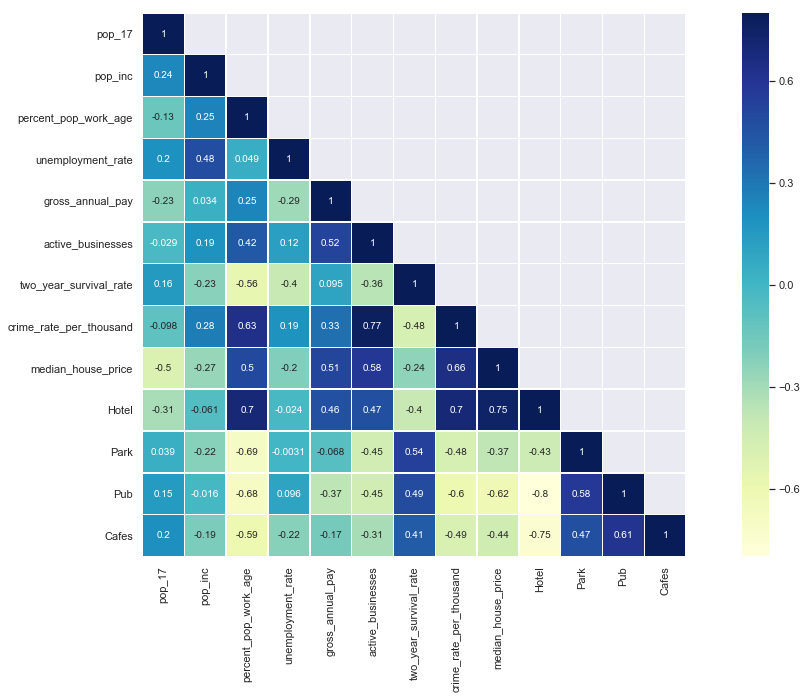

In [39]:
# we create a correlation matrix to identify existing relationships in the variables
corrMatt = X.corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(20,10)
sns.heatmap(corrMatt, mask=mask,vmax=.8, cmap='YlGnBu', linewidths=.5, square=True,annot=True)

<div class="alert alert-block alert-info">
<b>Insight:</b> There matrix shows some interesting correlations. 
Crime rate and active businesses.</div>

## 3. Clustering
### 3.1 Running the model. KMeans

In [40]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import classification_report, cluster, confusion_matrix, classification

In [41]:
# we convert categorical column with get_dummies
X = pd.get_dummies(X, drop_first=True)
X.head()

,pop_17,pop_inc,percent_pop_work_age,unemployment_rate,gross_annual_pay,active_businesses,two_year_survival_rate,crime_rate_per_thousand,median_house_price,Hotel,Park,Pub,Cafes,inner_outer_Outer
0,210711,0.13,63.1,11.0,27886.0,6560,73.0,83.4,243500,5.0,17.0,11.0,7.0,1
1,387803,0.08,64.9,8.5,33443.0,26190,73.8,62.7,445000,0.0,10.0,10.0,11.0,1
2,246124,0.06,62.9,7.6,34350.0,9075,73.5,51.8,275000,5.0,12.0,5.0,4.0,1
3,329102,0.05,67.8,7.5,29812.0,15745,74.4,78.8,407250,4.0,10.0,6.0,2.0,1
4,329391,0.06,62.6,5.3,37682.0,15695,78.6,64.1,374975,0.0,11.0,14.0,11.0,1


In [42]:
# Standarize features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [49]:
# Create k-mean object
clt = KMeans(n_clusters=6, random_state=0, n_jobs=-1)

# Train model
model = clt.fit(X_std)

In [ ]:
clt_labels = model.labels_
clt_labels

<div class="alert alert-block alert-info">
<b>Clusters:</b> We choose 6 clusters for the model to minimize the distortion score</div>

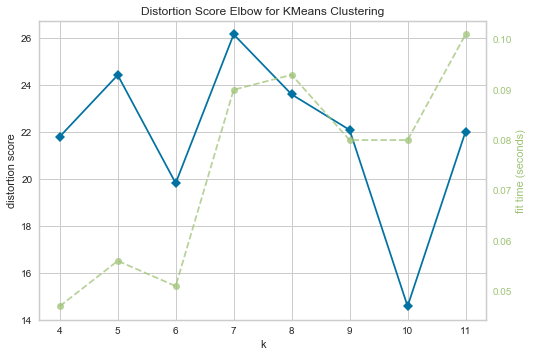

In [45]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the visualizer
visualizer = KElbowVisualizer(model, k=(4,12))

visualizer.fit(X_std)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

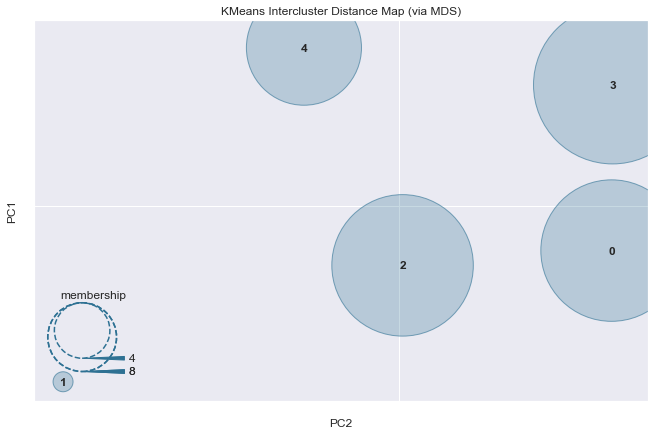

In [80]:
from yellowbrick.cluster import InterclusterDistance

visualizer = InterclusterDistance(KMeans(5))

visualizer.fit(X_std) # Fit the training data to the visualizer
visualizer.poof() # Draw/show/poof the data

### 3.2 Comparing the clusters
We can start comparing the different clusters using the criteria agreed at the begining of the project.

In [50]:
df['cluster_label'] = model.labels_

In [51]:
df_labeled = df
df.head()

,name,cartodb_id,created_at,updated_at,geometry,pop_11,pop_17,pop_inc,inner_outer,percent_pop_work_age,unemployment_rate,gross_annual_pay,active_businesses,two_year_survival_rate,crime_rate_per_thousand,median_house_price,Hotel,Park,Pub,Cafes,cluster_label
0,Barking and Dagenham,1,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.148209 51.599635, 0.148199 51.599...",187029,210711,0.13,Outer,63.1,11.0,27886.0,6560,73.0,83.4,243500,5.0,17.0,11.0,7.0,1
1,Barnet,2,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((-0.183361 51.668682, -0.183383 51.6...",357538,387803,0.08,Outer,64.9,8.5,33443.0,26190,73.8,62.7,445000,0.0,10.0,10.0,11.0,1
2,Bexley,3,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.158044 51.509044, 0.156309 51.509...",232774,246124,0.06,Outer,62.9,7.6,34350.0,9075,73.5,51.8,275000,5.0,12.0,5.0,4.0,1
3,Brent,4,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((-0.212138 51.555582, -0.212689 51.5...",312245,329102,0.05,Outer,67.8,7.5,29812.0,15745,74.4,78.8,407250,4.0,10.0,6.0,2.0,1
4,Bromley,5,2015-07-01T09:57:45,2015-07-01T09:57:45,"(POLYGON ((0.076463 51.430995, 0.075932 51.431...",310554,329391,0.06,Outer,62.6,5.3,37682.0,15695,78.6,64.1,374975,0.0,11.0,14.0,11.0,0


In [52]:
print('Cluster 0 is formed by', len(df_labeled[df_labeled['cluster_label'] == 0]), 'Boroughs:', df_labeled[df_labeled['cluster_label'] == 0]['name'].str.cat(sep=', '))
print('Cluster 1 is formed by', len(df_labeled[df_labeled['cluster_label'] == 1]), 'Boroughs:', df_labeled[df_labeled['cluster_label'] == 1]['name'].str.cat(sep=', '))
print('Cluster 2 is formed by', len(df_labeled[df_labeled['cluster_label'] == 2]), 'Boroughs:', df_labeled[df_labeled['cluster_label'] == 2]['name'].str.cat(sep=', '))
print('Cluster 3 is formed by', len(df_labeled[df_labeled['cluster_label'] == 3]), 'Borough:', df_labeled[df_labeled['cluster_label'] == 3]['name'].str.cat(sep=', '))
print('Cluster 4 is formed by', len(df_labeled[df_labeled['cluster_label'] == 4]), 'Boroughs:', df_labeled[df_labeled['cluster_label'] == 4]['name'].str.cat(sep=', '))
print('Cluster 5 is formed by', len(df_labeled[df_labeled['cluster_label'] == 5]), 'Borough:', df_labeled[df_labeled['cluster_label'] == 5]['name'].str.cat(sep=', '))

Cluster 0 is formed by 5 Boroughs: Bromley, Kingston upon Thames, Merton, Richmond upon Thames, Sutton
Cluster 1 is formed by 15 Boroughs: Barking and Dagenham, Barnet, Bexley, Brent, Croydon, Ealing, Enfield, Greenwich, Harrow, Havering, Hillingdon, Hounslow, Newham, Redbridge, Waltham Forest
Cluster 2 is formed by 3 Boroughs: Hammersmith and Fulham, Kensington and Chelsea, Wandsworth
Cluster 3 is formed by 1 Borough: City of London
Cluster 4 is formed by 8 Boroughs: Camden, Hackney, Haringey, Islington, Lambeth, Lewisham, Southwark, Tower Hamlets
Cluster 5 is formed by 1 Borough: Westminster


<div class="alert alert-block alert-info">
<b>Clusters:</b> These are the resulting clusters with the boroughs that form them</div>

We can quickly see the boroughs on a map

In [110]:
lat = 51.510067
lng = -0.133869
zoom_start = 10


m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'cluster_label'
cmap = cm.linear.viridis.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.7, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

marker = MarkerCluster().add_to(m) 
for ix, row in df.iterrows(): 
    text = "Borough: " + str(row['name']) + "<br>" + ft + ': '+ str(row[ft]) + "<br>" + "Population: " + str(row['pop_17']) 
    popup = folium.Popup(IFrame(text, width=300, height=100))
    folium.Marker(location = [row.geometry.centroid.y ,row.geometry.centroid.x], popup=popup).add_to(marker)
    
cmap.caption = 'Number of Cafes'
m.add_child(cmap)

m

In [53]:
df_cluster = pd.DataFrame(df_labeled.groupby('cluster_label').mean().round(2).reset_index())

In [54]:
df_cluster

,cluster_label,cartodb_id,pop_11,pop_17,pop_inc,percent_pop_work_age,unemployment_rate,gross_annual_pay,active_businesses,two_year_survival_rate,crime_rate_per_thousand,median_house_price,Hotel,Park,Pub,Cafes
0,0,21.20,210036.60,221795.00,0.06,65.16,4.74,36884.60,11926.00,77.72,58.90,418995.00,1.00,13.00,11.60,13.2
1,1,13.07,281572.13,301234.33,0.07,65.71,6.59,31795.27,13676.67,74.09,72.37,344397.93,2.20,10.47,8.33,10.0
2,2,21.67,216135.33,220665.33,0.01,71.47,4.87,37755.39,15713.33,74.57,102.23,829000.00,15.33,9.33,0.67,4.0
3,3,7.00,7412.00,7654.00,0.03,73.10,6.20,34161.16,26130.00,64.30,84.87,799999.00,9.00,1.00,2.00,4.0
4,4,19.25,256905.25,285383.12,0.11,72.65,6.07,34549.75,18484.38,72.20,102.08,486562.50,7.88,5.75,2.75,5.0
5,5,33.00,219582.00,244796.00,0.11,72.30,8.80,42141.00,55385.00,68.80,212.40,920000.00,15.00,6.00,0.00,5.0


### 3.2.1 Growing population
Which cluster shows higher growth rates?

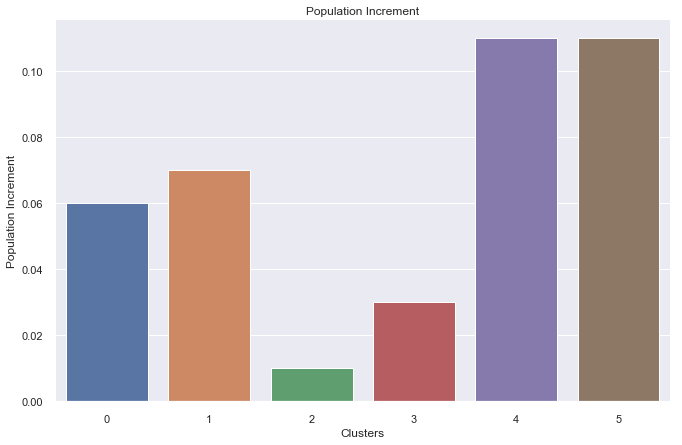

In [93]:
pop = sns.barplot(x='cluster_label', y='pop_inc', data=df_cluster)
pop.set_title('Population Increment')
pop.set_xlabel('Clusters')
pop.set_ylabel('Population Increment')
sns.despine(left=True)

<div class="alert alert-block alert-info">
<b>Growing population:</b> We can clearly see that clusters 4 and 5 show significantly higher rates.</div>

### 3.2.2 Working population
Which cluster show lower unemployment rates?

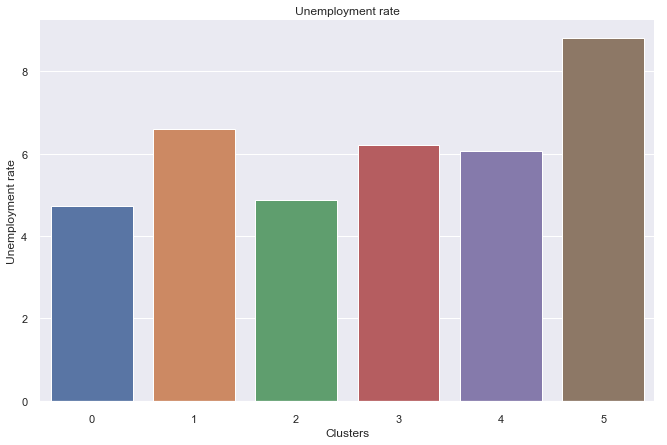

In [98]:
pop = sns.barplot(x='cluster_label', y='unemployment_rate', data=df_cluster)
pop.set_title('Unemployment rate')
pop.set_xlabel('Clusters')
pop.set_ylabel('Unemployment rate')
sns.despine(left=True)

<div class="alert alert-block alert-info">
<b>Working population:</b> In this case, clusters 0, 2 and 4 show the lowest rates. Cluster 5, on the contrary, shows the highest.</div>

### 3.2.3 Mid-high income
Which cluster show higher gross annual income?

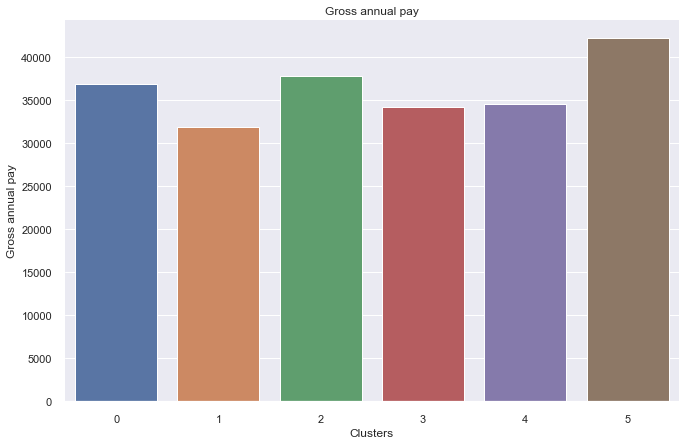

In [96]:
pop = sns.barplot(x='cluster_label', y='gross_annual_pay', data=df_cluster)
pop.set_title('Gross annual pay')
pop.set_xlabel('Clusters')
pop.set_ylabel('Gross annual pay')
sns.despine(left=True)

<div class="alert alert-block alert-info">
<b>Income:</b> Clusters 2 and 5 are slightly ahead. Those clusters include Boroughs like Chelsea, the City and other wealthy areas. Clusters 3 and 4 can be considered in the middle.</div>

### 3.2.4 Crime rates
Which cluster show lower crime rates?

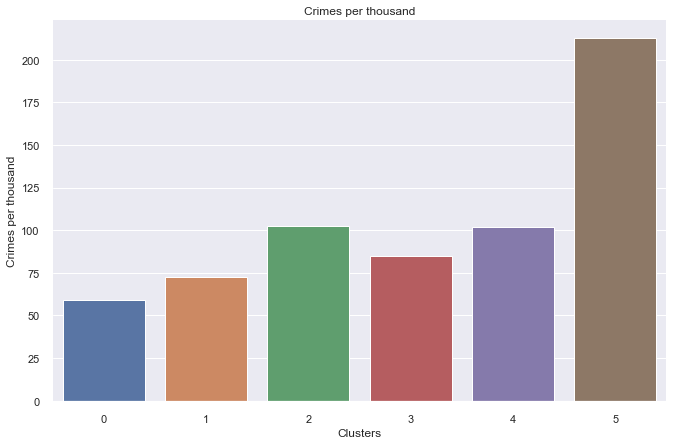

In [94]:
pop = sns.barplot(x='cluster_label', y='crime_rate_per_thousand', data=df_cluster)
pop.set_title('Crimes per thousand')
pop.set_xlabel('Clusters')
pop.set_ylabel('Crimes per thousand')
sns.despine(left=True)

<div class="alert alert-block alert-info">
<b>Crime:</b> Cluster 5 is clearly leading in crime rates.</div>

### 3.2.5 Business survival rates?
Which cluster show higher survival rate for businesses after two years of activity?

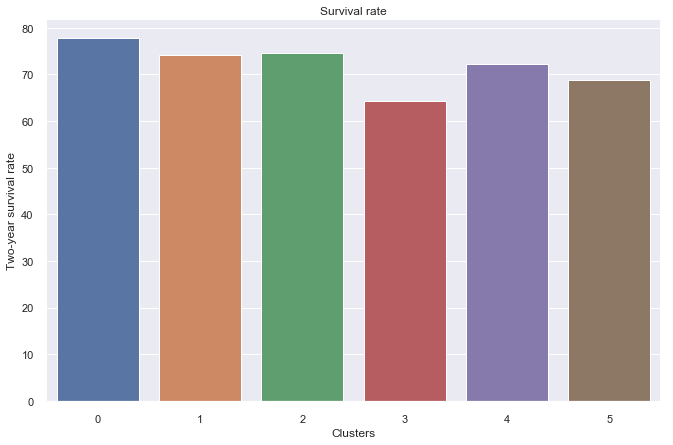

In [95]:
pop = sns.barplot(x='cluster_label', y='two_year_survival_rate', data=df_cluster)
pop.set_title('Survival rate')
pop.set_xlabel('Clusters')
pop.set_ylabel('Two-year survival rate')
sns.despine(left=True)

<div class="alert alert-block alert-info">
<b>Clusters:</b> There matrix shows some interesting correlations. 
Crime rate and active businesses</div>

### 3.3 What cluster fits the requirements?

<div class="alert alert-block alert-success">
<b>Result</b> Once analysed we would recommend opening the business in cluster 4
</div>

## 4. Building Visualizations

### 4.1 What boroughs are growing in population?

In [100]:
lat = 51.510067
lng = -0.133869
zoom_start = 10
avg_inc = np.mean(df.pop_inc)

m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'pop_inc'
cmap = cm.linear.viridis.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.5, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

for row in df.itertuples():
    m.add_child(folium.Marker(location=[row.geometry.centroid.y, row.geometry.centroid.x],
           popup=row.name, icon=folium.Icon(color='green' if row.pop_inc > avg_inc else 'purple', prefix='fa', icon='circle')))
    
cmap.caption = 'Population Increase'
m.add_child(cmap)

legend_html =   '''
                <div style="position: fixed; 
                            bottom: 50px; left: 50px; width: 130px; height: 90px; 
                            border:2px solid grey; z-index:9999; font-size:14px; background-color:white;
                            ">&nbsp; Population growth <br>
                              &nbsp; Above avg &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; Below avg &nbsp; <i class="fa fa-map-marker fa-2x" style="color:purple"></i>
                </div>
                ''' 
m.get_root().html.add_child(folium.Element(legend_html))

m

### 4.2 What boroughs show higher business survival rates?

In [55]:
lat = 51.510067
lng = -0.133869
zoom_start = 10


m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'two_year_survival_rate'
cmap = cm.linear.viridis.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.7, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

marker = MarkerCluster().add_to(m) 
for ix, row in df.iterrows(): 
    text = "Borough: " + str(row['name']) + "<br>" + ft + ': '+ str(row[ft]) + "<br>" + "Population: " + str(row['pop_17']) 
    popup = folium.Popup(IFrame(text, width=300, height=100))
    folium.Marker(location = [row.geometry.centroid.y ,row.geometry.centroid.x], popup=popup).add_to(marker)
    
cmap.caption = 'Two-year survival rate for businesses'
m.add_child(cmap)
m

### 4.3 What boroughs show higher crime rates?

In [56]:
lat = 51.510067
lng = -0.133869
zoom_start = 10


m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'crime_rate_per_thousand'
cmap = cm.linear.YlOrBr_09.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.7, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

marker = MarkerCluster().add_to(m) 
for ix, row in df.iterrows(): 
    text = "Borough: " + str(row['name']) + "<br>" + ft + ': '+ str(row[ft]) + "<br>" + "Population: " + str(row['pop_17']) 
    popup = folium.Popup(IFrame(text, width=300, height=100))
    folium.Marker(location = [row.geometry.centroid.y ,row.geometry.centroid.x], popup=popup).add_to(marker)
    
cmap.caption = 'Crime Rate Per 1000'
m.add_child(cmap)

m

### 4.4 What boroughs have more cafes?

In [57]:
lat = 51.510067
lng = -0.133869
zoom_start = 10


m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'Cafes'
cmap = cm.linear.viridis.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.7, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

marker = MarkerCluster().add_to(m) 
for ix, row in df.iterrows(): 
    text = "Borough: " + str(row['name']) + "<br>" + ft + ': '+ str(row[ft]) + "<br>" + "Population: " + str(row['pop_17']) 
    popup = folium.Popup(IFrame(text, width=300, height=100))
    folium.Marker(location = [row.geometry.centroid.y ,row.geometry.centroid.x], popup=popup).add_to(marker)
    
cmap.caption = 'Number of Cafes'
m.add_child(cmap)

m

### 4.5 What boroughs show lower unemployment rate?

In [58]:
lat = 51.510067
lng = -0.133869
zoom_start = 10


m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'unemployment_rate'
cmap = cm.linear.viridis.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.7, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

marker = MarkerCluster().add_to(m) 
for ix, row in df.iterrows(): 
    text = "Borough: " + str(row['name']) + "<br>" + ft + ': '+ str(row[ft]) + "<br>" + "Population: " + str(row['pop_17']) 
    popup = folium.Popup(IFrame(text, width=300, height=100))
    folium.Marker(location = [row.geometry.centroid.y ,row.geometry.centroid.x], popup=popup).add_to(marker)
    
cmap.caption = 'Unemployment rate'
m.add_child(cmap)

m

In [59]:
lat = 51.510067
lng = -0.133869
zoom_start = 10


m = folium.Map(location=[lat, lng], zoom_start=zoom_start) # generate map centred around the Conrad Hotel
ft = 'active_businesses'
cmap = cm.linear.viridis.scale(df[ft].min(), df[ft].max())
folium.GeoJson(df, style_function=lambda feature: { 
             'fillColor': cmap(feature['properties'][ft]),
             'fillOpacity' : 0.7, 
             'weight' : 0.4, 
            'color' : 'black'
        

}).add_to(m) 

marker = MarkerCluster().add_to(m) 
for ix, row in df.iterrows(): 
    text = "Borough: " + str(row['name']) + "<br>" + ft + ': '+ str(row[ft]) + "<br>" + "Population: " + str(row['pop_17']) 
    popup = folium.Popup(IFrame(text, width=300, height=100))
    folium.Marker(location = [row.geometry.centroid.y ,row.geometry.centroid.x], popup=popup).add_to(marker)
    
cmap.caption = 'Number of Active Businesses'
m.add_child(cmap)

m